# Evaluating Color Blindness Simulations
> How well does each model match my perception? What severity do I have?

- toc: true 
- badges: true
- comments: true
- categories: [simulation]
- permalink: /evaluating-cvd-simulation/
- image: images/chart-preview.png
- hide: false

In [1]:
# hide
%load_ext autoreload
%autoreload 2

In [13]:
# hide
%pip install -q pandas Geometry3D
%pip install -q --upgrade plotly daltonlens

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [14]:
# hide_input
import plotly.io as pio
if pio.renderers.default != 'colab':
    pio.renderers.default = 'notebook_connected'
from IPython.display import display, HTML
js = '<script src="https://cdnjs.cloudflare.com/ajax/libs/require.js/2.3.6/require.min.js" integrity="sha512-c3Nl8+7g4LMSTdrm621y7kf9v3SDPnhxLNhcjFJbKECVnmZHTdo+IRO05sNLTH/D3vA6u1X32ehoLC7WFVdheg==" crossorigin="anonymous"></script>'
display(HTML(js))

## Generated Ishihara-like plates to evaluate the kind and severity of CVD

It is possible to generate Ishihara-like plates for a given deficiency and severity factor. The main idea is to pick a confusion segment in the LMS space, and generate an Ishihara-like image by using one end of the segment as the background color and the other end as the foreground color (a single-digit number). On top of that lower degrees of severity can be tested by making the segment shorter, effectively reducing the distance between the colors along the confusion line. This makes it harder and harder to differentiate for someone with anomalous trichromacy.

By looking at these generated plates it becomes possible to self-evaluate the kind of deficiency by checking in which plate the numbers are the harder to read. For example I can read all the numbers in the tritan plate, most numbers in the deutan plate (but not all), and barely any in the protan plate. This confirms that I am a protan.

Then the severity can be evaluated by looking at plates generated with decreasing severity and checking at which value it becomes impossible to see any number. For me that's around 0.8 for the protan plate.


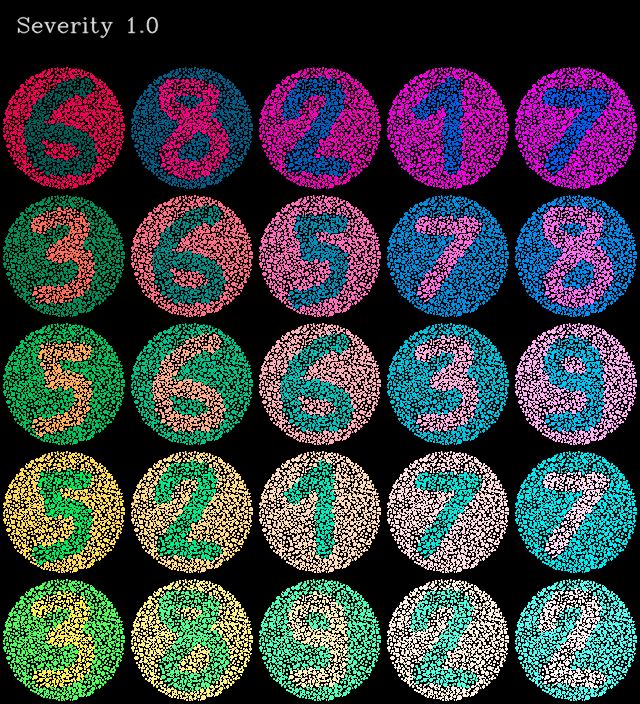
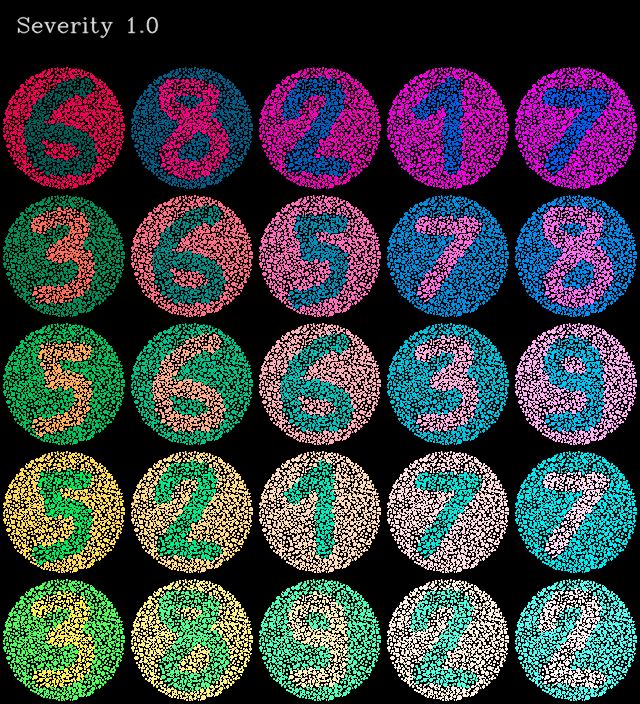
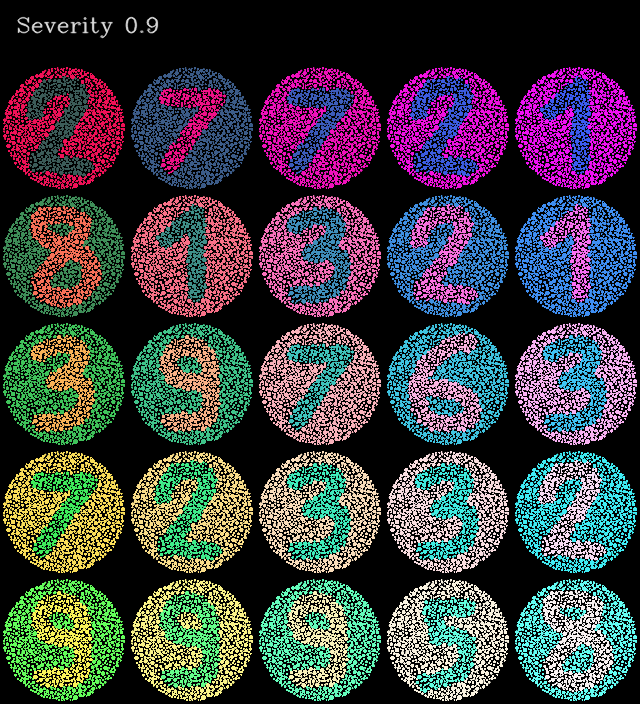
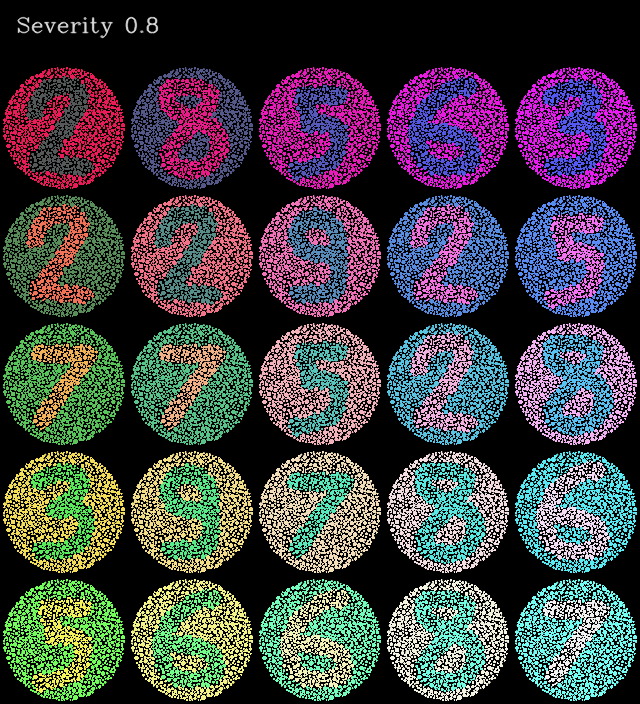
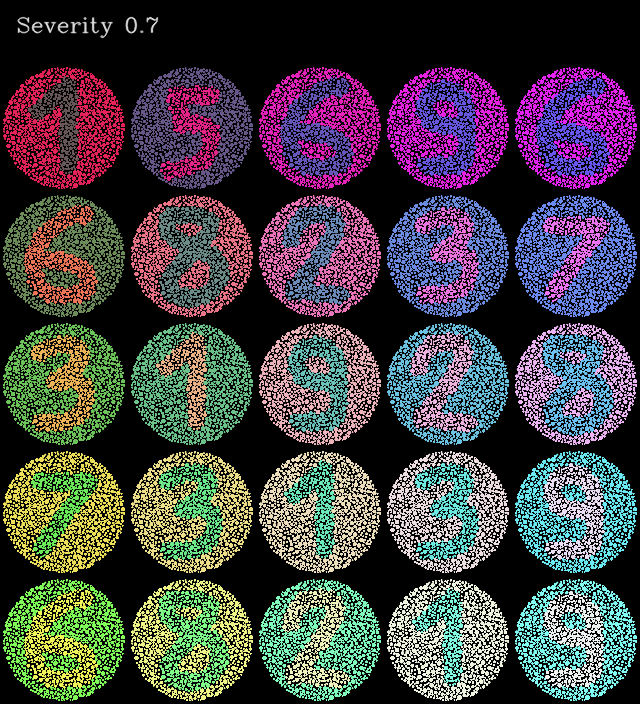
...
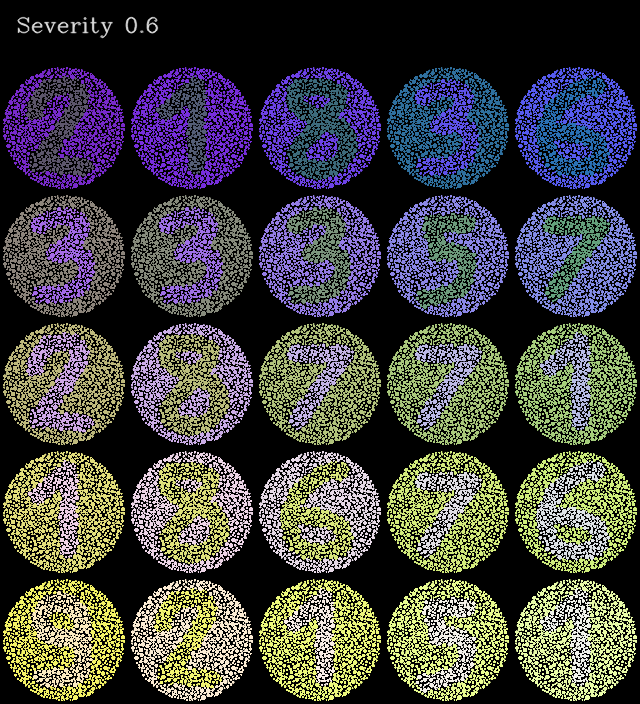
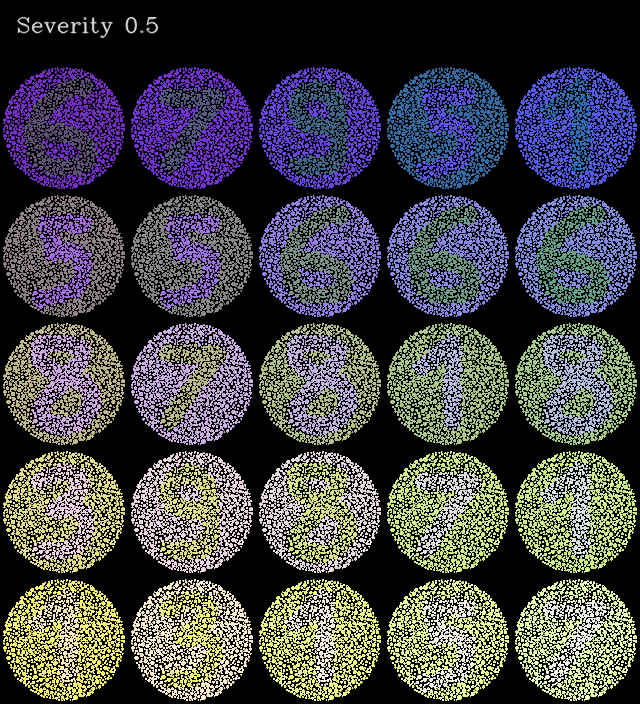
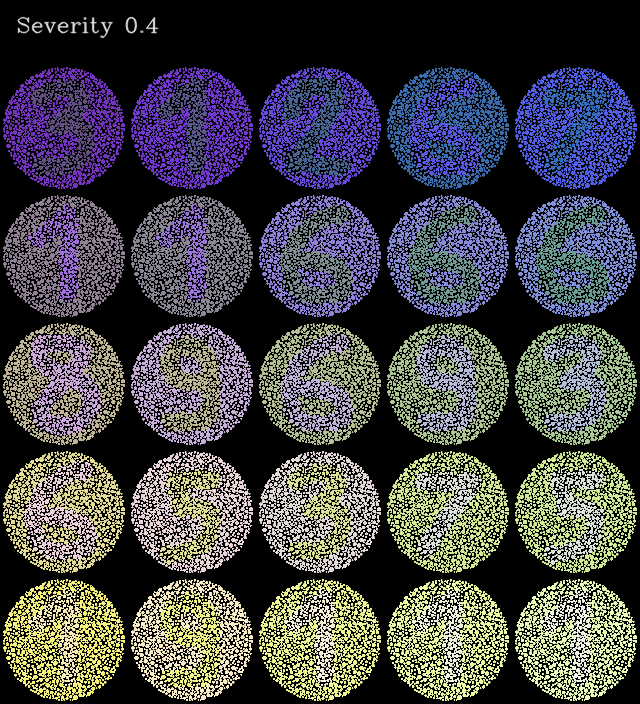
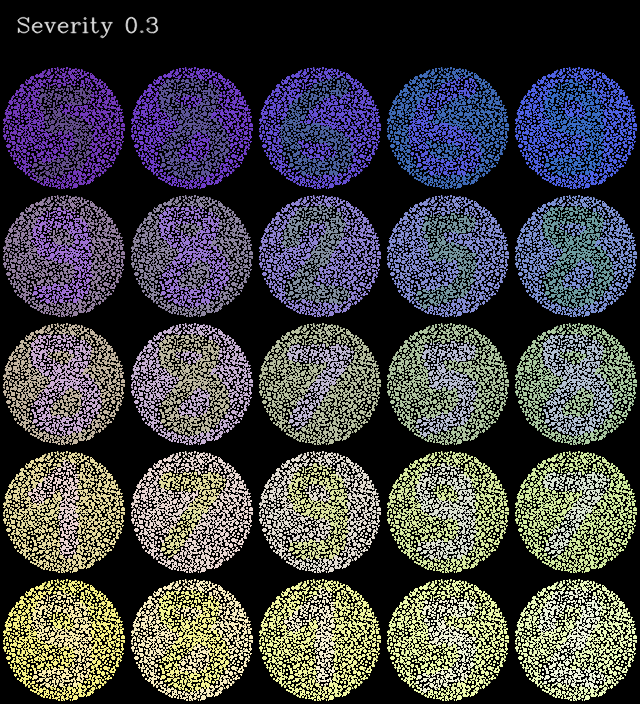
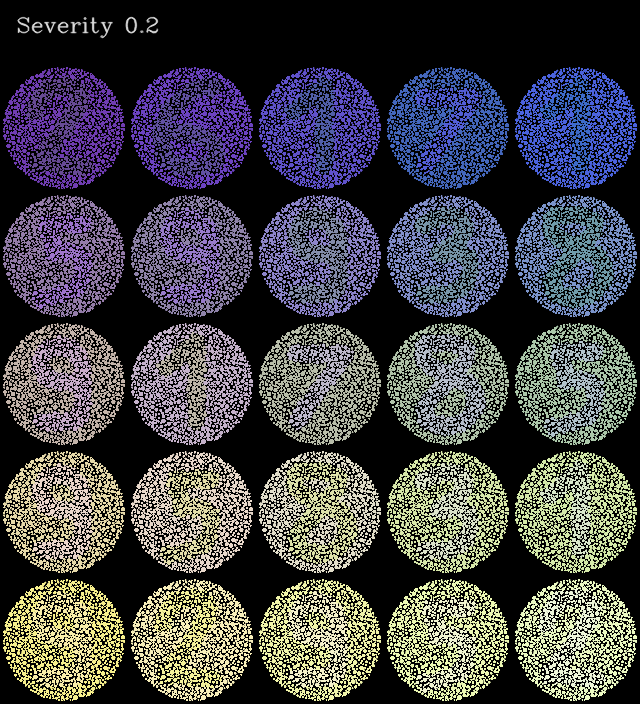

In [11]:
# collapse-hide
# This cell defines all our imports and a few utilities
import daltonlens.generate as generate
import daltonlens.simulate as simulate
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Utility for plotly imshow
hide_image_axes = dict(yaxis_visible=False, yaxis_showticklabels=False, xaxis_visible=False, xaxis_showticklabels=False, margin=dict(l=0, r=0, b=0, t=0))

def showAnimatedImages(title, deficiency):
    images = []
    for severity in np.arange(1.0, 0.19, -0.1):
        im = generate.ishihara_plate(deficiency, severity, f"Severity {severity:.1f}")
        images.append (im)
    images = np.stack(images, axis=0)
    fig = px.imshow(images, height=704*1.4, animation_frame=0, title=title).update_layout(hide_image_axes).update_layout(margin=None)
    fig.show()

showAnimatedImages("Protanopia / protanomaly", simulate.Deficiency.PROTAN)
showAnimatedImages("Deuteranopia / deuteranomaly", simulate.Deficiency.DEUTAN)
showAnimatedImages("Tritanopia / tratanomaly", simulate.Deficiency.TRITAN)

{% bibliography --cited %}

In [ ]:
#hide
# The cell above will show a nice bibliography in the HTML output.